 # Лабораторная работа 1. Обучение без учителя

Результат лабораторной работы − отчет. Мы предпочитаем принимать отчеты в формате ноутбуков IPython (ipynb-файл). Постарайтесь сделать ваш отчет интересным рассказом, последовательно отвечающим на вопросы из заданий. Помимо ответов на вопросы, в отчете также должен быть код, однако чем меньше кода, тем лучше всем: нам − меньше проверять, вам — проще найти ошибку или дополнить эксперимент. При проверке оценивается четкость ответов на вопросы, аккуратность отчета и кода.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Сдавать задание после указанного срока сдачи нельзя. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов и понижают карму (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий в открытом источнике, необходимо прислать ссылку на этот источник (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, нам необходима ссылка на источник).

### Правила сдачи
Выполненную работу следует отправить в систему Anytask. Более подробно о системе можно почитать на странице курса. Название отправляемого файла должно иметь следующий формат: Surname_Name_Group_NN.ipynb, где NN — номер лабораторной работы. Например, Kozlova_Anna_CS_01.ipynb.

## Кластеризация

![Digits](https://www.dropbox.com/s/nrjiahdbpswd63y/digits.png?dl=1)

Задача [кластеризации](https://en.wikipedia.org/wiki/Cluster_analysis) данных является одним из примеров задач обучения "без учителя". Она заключается в разбиении множества объектов на заданное число кластеров, при этом предполагается, что внутри одного кластера будут находиться похожие между собой объекты. Одним из примеров методов кластеризации является алгоритм [KMeans](https://en.wikipedia.org/wiki/K-means_clustering).

### Выбор числа кластеров

Для некоторых алгоритмов кластеризации число кластеров является гиперпараметром (например, в случае KMeans). Поэтому для выбора количества кластеров может быть испоьзован следующий подход: при фиксированной метрики качества для разного числа кластеров вычисляют кластеризацию и выбирают то значение, начиная с которого качество "стабилизируется".

### Метрики качества

Оценивание качества построенной кластеризации не всегда тривиальная задача, так как следует учитывать такие факты как:
 - объекты одного класса должны быть более похоже, чем объекты других кластеров, относительно некоторой заданной метрики похожести
 - метрика не должна учитывать абсолютные значения меток объектов, попавших в кластер (в случае, если истинные метоки известны)

При выполнении задания для оценки качества получившейся кластеризации воспользуемся следующими метриками:
 - [Homogeneity и Completeness](http://scikit-learn.org/stable/modules/clustering.html#homogeneity-completeness-and-v-measure) 
 - [Adjusted Rand index](http://scikit-learn.org/stable/modules/clustering.html#adjusted-rand-index) 
 - [Silhouette Coefficient](http://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient)

Загрузите набор данных [digits](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_digits.html). Перед применением алгоритмов не забудьте перемешать изображения в случайном порядке.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from skimage import io

In [2]:
from sklearn.datasets import load_digits
digits_data_set = load_digits()
digits_data_set
labels_true = digits_data_set.target 
images = digits_data_set.images
data = digits_data_set.data
print data.shape

(1797, 64)


In [3]:
perm = np.random.permutation(data.shape[0])
data = data[perm]
images = images[perm]
labels_true = labels_true[perm]
print data.shape
print labels_true

(1797, 64)
[7 0 5 ..., 4 5 4]


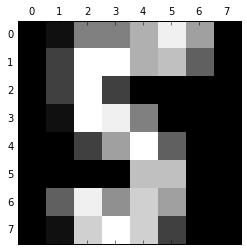

In [4]:

plt.figure()
plt.gray()
plt.matshow(images[-2])

**(0.5 балла)** Кластеризуйте изображения при помощи алгоритма [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html), подобрав число кластеров для некоторой фиксированной метрики из указанных выше. Рассмотрите различные способы выбора начального приближения (параметр *init*). Оцените качество получившейся кластеризации используя все описанные выше метрики. Визуализируйте изображения, соответствующие центроидам лучшей кластеризации.

In [5]:
from sklearn.cluster import KMeans
from sklearn import metrics

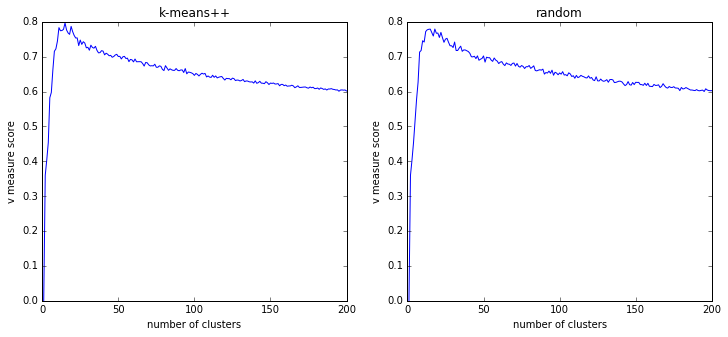

In [6]:
n_max = 201
metric_values_rand = []
metric_values_kplus = []
for n_cl in range(1,n_max):
    #print n_cl
    labels_pred = KMeans(n_clusters=n_cl, init='k-means++').fit_predict(data)
    metric_values_kplus.append(metrics.v_measure_score(labels_true, labels_pred))
    labels_pred = KMeans(n_clusters=n_cl, init='random').fit_predict(data)
    metric_values_rand.append(metrics.v_measure_score(labels_true, labels_pred))

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(range(1,n_max),metric_values_kplus)
plt.xlabel("number of clusters")
plt.ylabel("v measure score")
plt.title("k-means++")
plt.subplot(1,2,2)
plt.plot(range(1,n_max),metric_values_rand)
plt.xlabel("number of clusters")
plt.ylabel("v measure score")
plt.title("random")
plt.show()

In [67]:
classifier = KMeans(n_clusters=60, init='k-means++', n_jobs=-1)
labels_kplus = classifier.fit_predict(data)
v_score_kplus = metrics.v_measure_score(labels_true, labels_kplus)
adj_rand_score_kplus = metrics.adjusted_rand_score(labels_true, labels_kplus)
silhouette_score_kplus = metrics.silhouette_score(data, labels_kplus, metric='euclidean')
centroids_kplus = classifier.cluster_centers_


In [70]:
classifier = KMeans(n_clusters=60, init='random', n_jobs=-1)
labels_random = classifier.fit_predict(data)
v_score_random= metrics.v_measure_score(labels_true, labels_random)
adj_rand_score_random = metrics.adjusted_rand_score(labels_true, labels_random)
silhouette_score_random = metrics.silhouette_score(data, labels_random, metric='euclidean')
centroids_random = classifier.cluster_centers_

In [71]:
print "k-means++ metrics values:  v_measure: " + str(v_score_kplus) + " adj_rand_score: " + str(adj_rand_score_kplus) + " silhoette: " + str(silhouette_score_kplus) 
print "random metrics values:  v_measure: " + str(v_score_random) + " adj_rand_score: " + str(adj_rand_score_random) + " silhoette: " + str(silhouette_score_random)

k-means++ metrics values:  v_measure: 0.686796795879 adj_rand_score: 0.28705843194 silhoette: 0.135386073105
random metrics values:  v_measure: 0.682998909616 adj_rand_score: 0.270281452661 silhoette: 0.133137368736


Оба начальных приближения дали практически одинаковые значения метрик. k-means++ чуть-чуть лучше, поэтому визуализирую центроиды для нее.

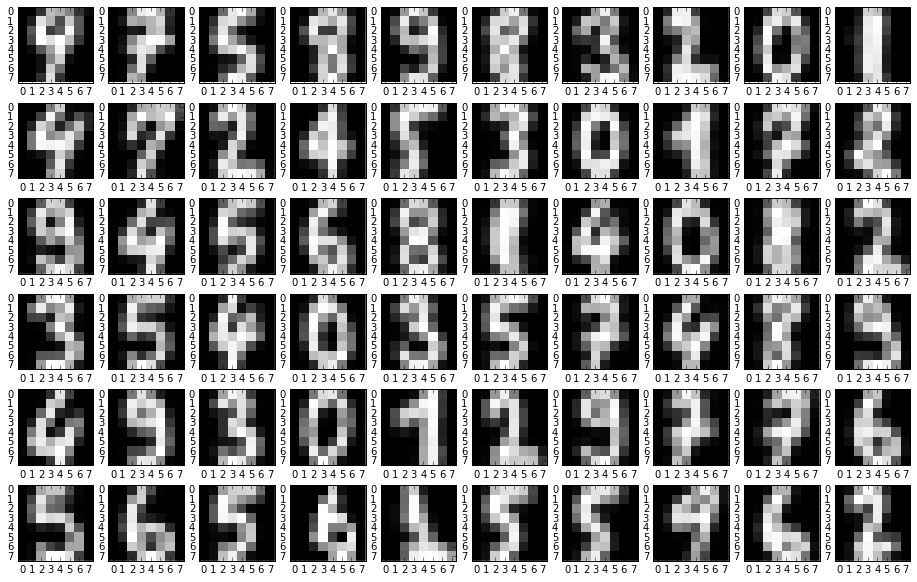

In [72]:
plt.figure(figsize=(16,10))
for i in range(60):
    plt.subplot(6,10,i+1)
    plt.gray()
    plt.imshow(np.reshape(centroids_random[i],(8,8)), interpolation='none')

Не всегда бывает удобно работать с полной матрицей объект-признак, например, для случая визуализации данных. В одной из предыдущих лабораторных работ был рассмотрен метод уменьшения размерности *PCA*. Вот [здесь](http://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html#example-manifold-plot-lle-digits-py) было показано сравнение различных способов сжатия размерности для проекции на плоскость. На изображениях видно, что некоторые преобразования дают неплохую картину и одинаковые цифры расположены близко друг к другу. Посмотрим, поможет ли это на практике.
 
**(1 балл)** Примените преобразования [PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) и [tSNE](http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) (для числа компонент 2 и 10) и сравните результаты с предыдущими. Нашелся ли метод кластеризации, превосходящий другие по всем метрикам? Являются ли все три метрики согласованными? Можете ли вы объяснить почему?

In [75]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

data_pca_2 = PCA(n_components=2).fit_transform(data)
print "done"
data_pca_10 = PCA(n_components=10).fit_transform(data)
print "done"
data_tsne_2 = TSNE(n_components=2).fit_transform(data)
print "done"
data_tsne_10 = TSNE(n_components=10).fit_transform(data)
print "done"

done
done
done
done


In [76]:
classifier = KMeans(n_clusters=60, init='k-means++', n_jobs=-1)
labels_pca_2 = classifier.fit_predict(data_pca_2)
v_score_pca_2 = metrics.v_measure_score(labels_true, labels_pca_2)
adj_rand_score_pca_2 = metrics.adjusted_rand_score(labels_true, labels_pca_2)
silhouette_score_pca_2 = metrics.silhouette_score(data, labels_pca_2, metric='euclidean')
centroids_pca_2 = classifier.cluster_centers_

In [77]:
classifier = KMeans(n_clusters=60, init='k-means++', n_jobs=-1)
labels_pca_10 = classifier.fit_predict(data_pca_10)
v_score_pca_10 = metrics.v_measure_score(labels_true, labels_pca_10)
adj_rand_score_pca_10 = metrics.adjusted_rand_score(labels_true, labels_pca_10)
silhouette_score_pca_10 = metrics.silhouette_score(data, labels_pca_10, metric='euclidean')
centroids_pca_10 = classifier.cluster_centers_

In [78]:
classifier = KMeans(n_clusters=60, init='k-means++', n_jobs=-1)
labels_tsne_2 = classifier.fit_predict(data_tsne_2)
v_score_tsne_2 = metrics.v_measure_score(labels_true, labels_tsne_2)
adj_rand_score_tsne_2 = metrics.adjusted_rand_score(labels_true, labels_tsne_2)
silhouette_score_tsne_2 = metrics.silhouette_score(data, labels_tsne_2, metric='euclidean')
centroids_tsne_2 = classifier.cluster_centers_

In [79]:
classifier = KMeans(n_clusters=60, init='k-means++', n_jobs=-1)
labels_tsne_10 = classifier.fit_predict(data_tsne_10)
v_score_tsne_10 = metrics.v_measure_score(labels_true, labels_tsne_10)
adj_rand_score_tsne_10 = metrics.adjusted_rand_score(labels_true, labels_tsne_10)
silhouette_score_tsne_10 = metrics.silhouette_score(data, labels_tsne_10, metric='euclidean')
centroids_tsne_10 = classifier.cluster_centers_

In [80]:
print "pca2:  v_measure: " + str(v_score_pca_2) + " adj_rand_score: " + str(adj_rand_score_pca_2) + " silhoette: " + str(silhouette_score_pca_2) 
print "pca10:  v_measure: " + str(v_score_pca_10) + " adj_rand_score: " + str(adj_rand_score_pca_10) + " silhoette: " + str(silhouette_score_pca_10) 
print "tsne2:  v_measure: " + str(v_score_tsne_2) + " adj_rand_score: " + str(adj_rand_score_tsne_2) + " silhoette: " + str(silhouette_score_tsne_2) 
print "tsne10:  v_measure: " + str(v_score_tsne_10) + " adj_rand_score: " + str(adj_rand_score_tsne_10) + " silhoette: " + str(silhouette_score_tsne_10) 

pca2:  v_measure: 0.458266585548 adj_rand_score: 0.136149772397 silhoette: -0.0624598499492
pca10:  v_measure: 0.676547276482 adj_rand_score: 0.276156764832 silhoette: 0.118091479816
tsne2:  v_measure: 0.710388019685 adj_rand_score: 0.276964469451 silhoette: 0.119118370872
tsne10:  v_measure: 0.0576908439187 adj_rand_score: 0.00912090868272 silhoette: -0.301913920312


Метрики почти согласованы, в том плане, что Для тех преобразований, для которых score по одной метрике выходит на уровне метрики для исходных данных, score по другой метрике примерно такой же. Однако, метрика silhouette все же немного проседает на преобразованных данных, при том, что tsne на 2 признака выдал даже несколько большую v_measure

**(0.5 балла)** Визуализируйте несколько изображений, которые во всех случаях были отнесены к неправильному кластеру (объект назовем ошибочно отнесенным, если он имеет иную метку класса, нежели большая часть объектов в кластере). Можете ли вы пояснить почему так произошло?

In [90]:
from scipy import stats
incorrect_indeces = []

for index in range(data.shape[0]):
    if labels_true[index] == stats.mode(labels_true[labels_kplus == labels_kplus[index]]).mode[0]:
        continue
    elif labels_true[index] == stats.mode(labels_true[labels_random == labels_random[index]]).mode[0]:
        continue
    elif labels_true[index] == stats.mode(labels_true[labels_pca_2 == labels_pca_2[index]]).mode[0]:
        continue
    elif labels_true[index] == stats.mode(labels_true[labels_pca_10 == labels_pca_10[index]]).mode[0]:
        continue
    elif labels_true[index] == stats.mode(labels_true[labels_tsne_2 == labels_tsne_2[index]]).mode[0]:
        continue
    elif labels_true[index] == stats.mode(labels_true[labels_tsne_10 == labels_tsne_10[index]]).mode[0]:
        continue
    else:
        incorrect_indeces.append(index)
    
incorrect_indeces = np.array(incorrect_indeces)
print incorrect_indeces

[  97  203  234  760  848  860 1085 1467 1740]


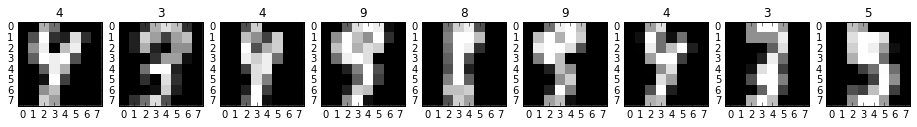

In [93]:
plt.figure(figsize=(16,5))
i = 0
for ind in incorrect_indeces:
    i+=1
    plt.subplot(1,incorrect_indeces.shape[0],i)
    plt.gray()
    plt.title(labels_true[ind])
    plt.imshow(images[ind], interpolation='none')


Все цифры, которые во всех случаях были отнесены к неправильному кластеру, очень плохо написаны. Цифру 8 и цифру 3 даже человеческим глазом сложно отличить от 1 и 7, например.

## Разделение изображения на семантические компоненты

![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. 

Загрузите [изображения](https://www.dropbox.com/s/ybnvkemeus9wupe/images.zip?dl=0).

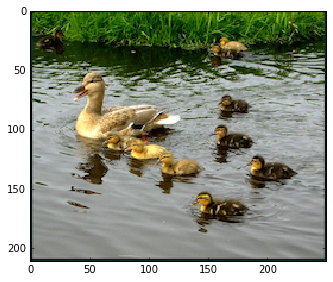

In [9]:
ducks = io.imread('images/ducks.jpg')
owl = io.imread('images/owl.jpg')
io.imshow(ducks)

Для каждого изображения, используя кластеризацию KMeans, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$, где 
$x_i$ и $y_i$ — координаты пикселя, $r_i, g_i, b_i$ — его цвет, $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

In [47]:
def create_psi (img, Lambda=1):
    rows = img.shape[0]
    cols = img.shape[1]
    i = 0
    
    psi = np.empty((rows*cols, 5))
    for row in xrange(rows):
        for col in xrange(cols):
            psi[i][0] = Lambda * col
            psi[i][1] = Lambda * row
            psi[i][2] = img[row, col, 0]
            psi[i][3] = img[row, col, 1]
            psi[i][4] = img[row, col, 2]
                
            i+=1
    return psi



In [41]:
def MakeKmean(img, Lambda=[1], N_CLUSTERS=[7]):
    plt.figure(figsize=(5 * len(N_CLUSTERS), 5  * len(Lambda)))
    i = 0
    for lam in Lambda:
        psi = create_psi(img, lam)
        for n_cl in N_CLUSTERS:
            i+=1
            plt.subplot(len(Lambda), len(N_CLUSTERS), i)
            clf_kmean = KMeans(n_clusters=n_cl, init='k-means++', n_jobs=-1)
            labels = clf_kmean.fit_predict(psi)
            labels = np.reshape(labels, (img.shape[0], img.shape[1]))
            plt.imshow(img)
            plt.title('lambda=' + str(lam) + ', clusters num=' + str(n_cl))
            for l in range(n_cl):
                plt.contour(labels == l, contours=1, colors=[plt.cm.spectral(l / float(n_cl)), ])

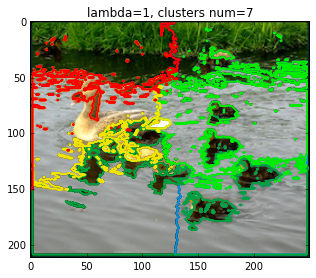

In [42]:
MakeKmean(ducks)

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html). Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

In [93]:
from skimage import color
from skimage import transform
from sklearn.cluster import spectral_clustering
from sklearn.feature_extraction import image


def MakeSpectral(img, assign = 'kmeans', betas = [5], N_CLUSTERS=[7]):
    #assign = ('kmeans', 'discretize')
    plt.figure(figsize=(5 * len(N_CLUSTERS), 5  * len(betas)))
    small_img = transform.rescale(img,0.5)
    img_gray = color.rgb2gray(small_img)
    graph = image.img_to_graph(img_gray)
    eps = 1e-6
    i = 0
    data = graph.data 
    
    for beta in betas:
        graph.data = np.exp(-beta * data / img_gray.std()) + eps
        for n_cl in N_CLUSTERS:
            i+=1
            plt.subplot(len(betas), len(N_CLUSTERS), i)
            labels = spectral_clustering(graph, n_clusters=n_cl,
                                 assign_labels=assign)
            labels = np.reshape(labels, (img_gray.shape[0], img_gray.shape[1]))
            plt.imshow(small_img)
            plt.title('assign='+ assign + ' beta=' + str(beta) + ', clusters num=' + str(n_cl))
            for l in range(n_cl):
                plt.contour(labels == l, contours=1, colors=[plt.cm.spectral(l / float(n_cl)), ])

**(1 балл)** Визуализируйте результаты сегментации (аналогично рисунку выше) для обоих методов.

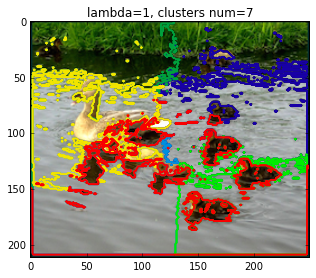

In [76]:
MakeKmean(ducks)


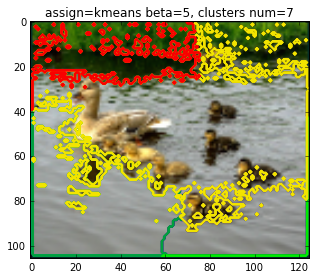

In [94]:
MakeSpectral(ducks)

**(1 балл)** Поэкспериментируйте с параметрами алгоритмов. Сравните два подхода и сегментации, к которым они приводят.
Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

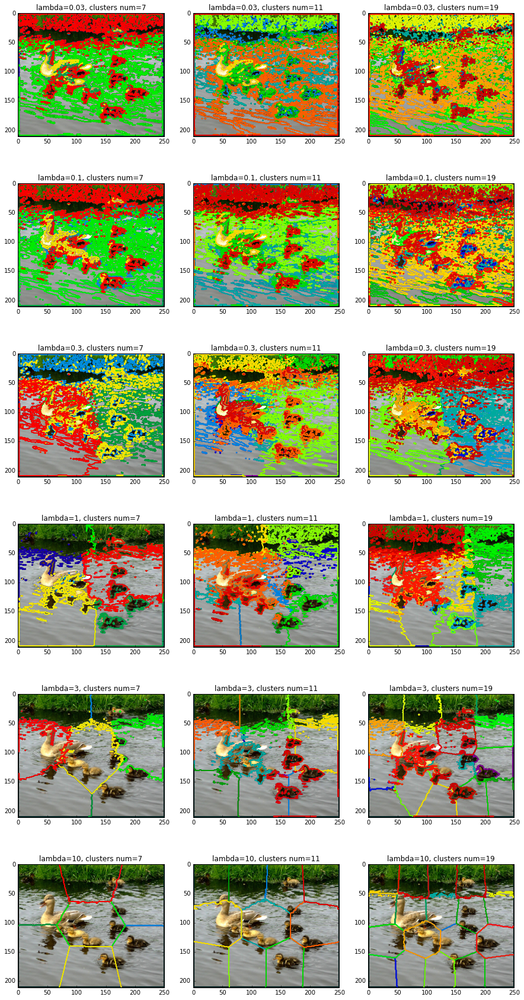

In [43]:
MakeKmean(ducks, Lambda=[0.03, 0.1, 0.3, 1, 3, 10], N_CLUSTERS=[7, 11, 19])

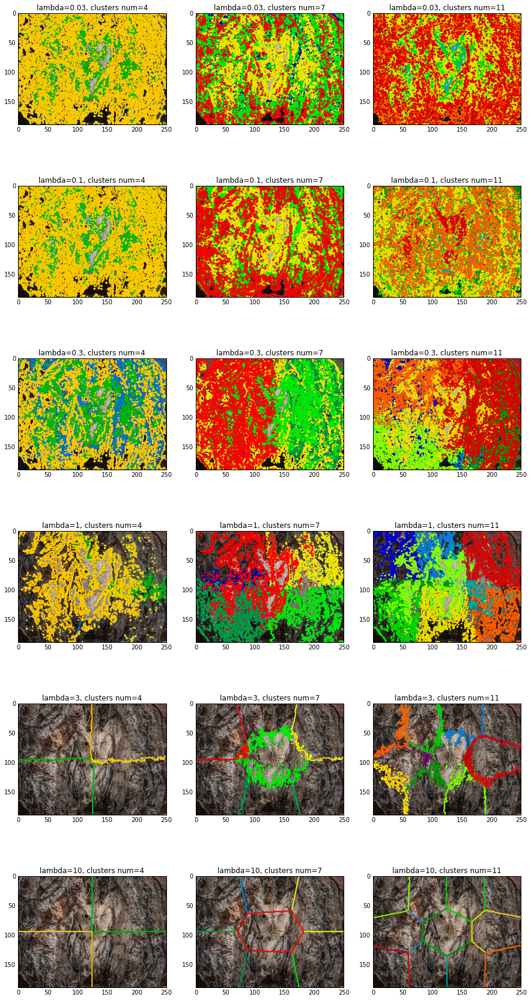

In [46]:
MakeKmean(owl, Lambda=[0.03, 0.1, 0.3, 1, 3, 10], N_CLUSTERS=[4, 7, 11])

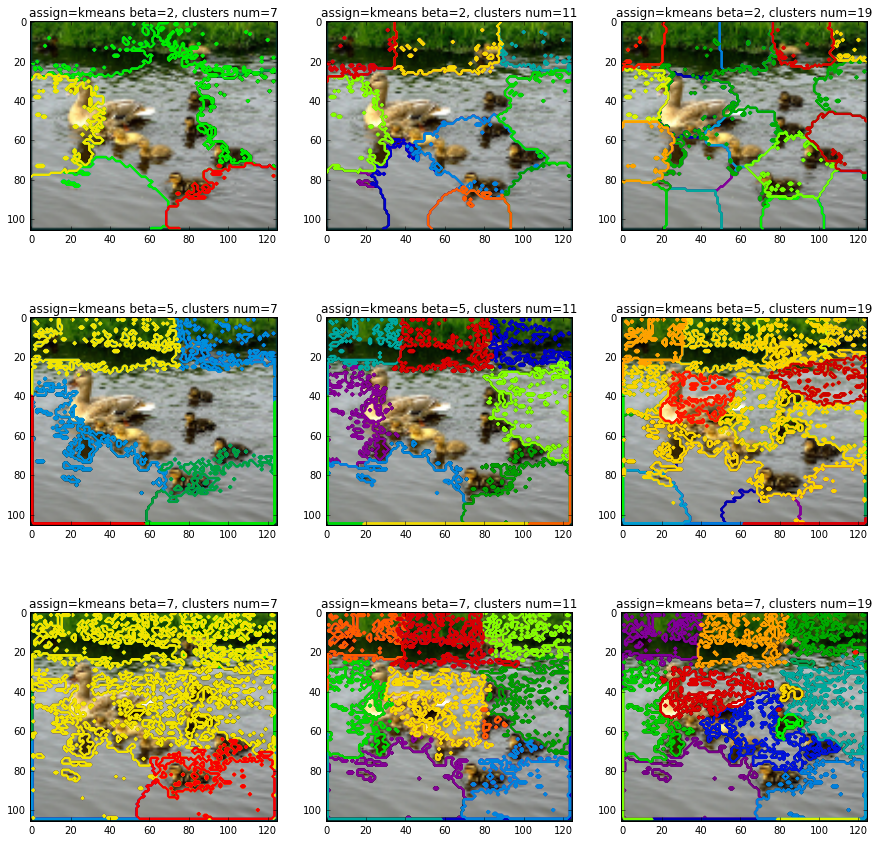

In [96]:
MakeSpectral(ducks, assign='kmeans', betas=[2,5,7], N_CLUSTERS=[7,11,19])

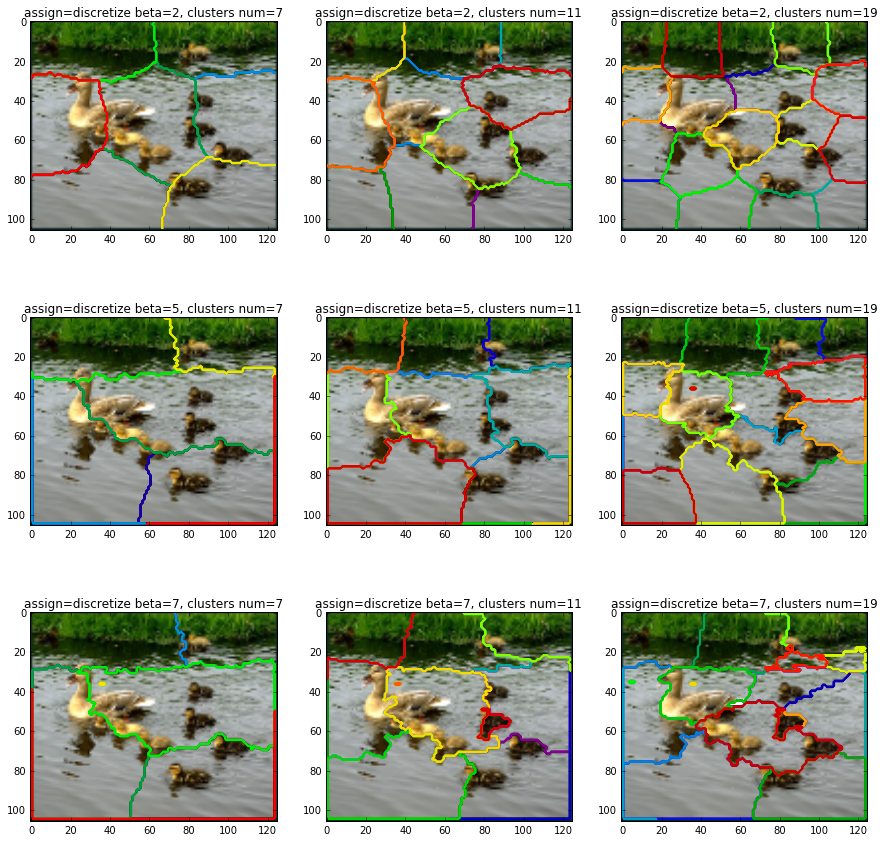

In [97]:
MakeSpectral(ducks, assign='discretize', betas=[2,5,7], N_CLUSTERS=[7,11,19])

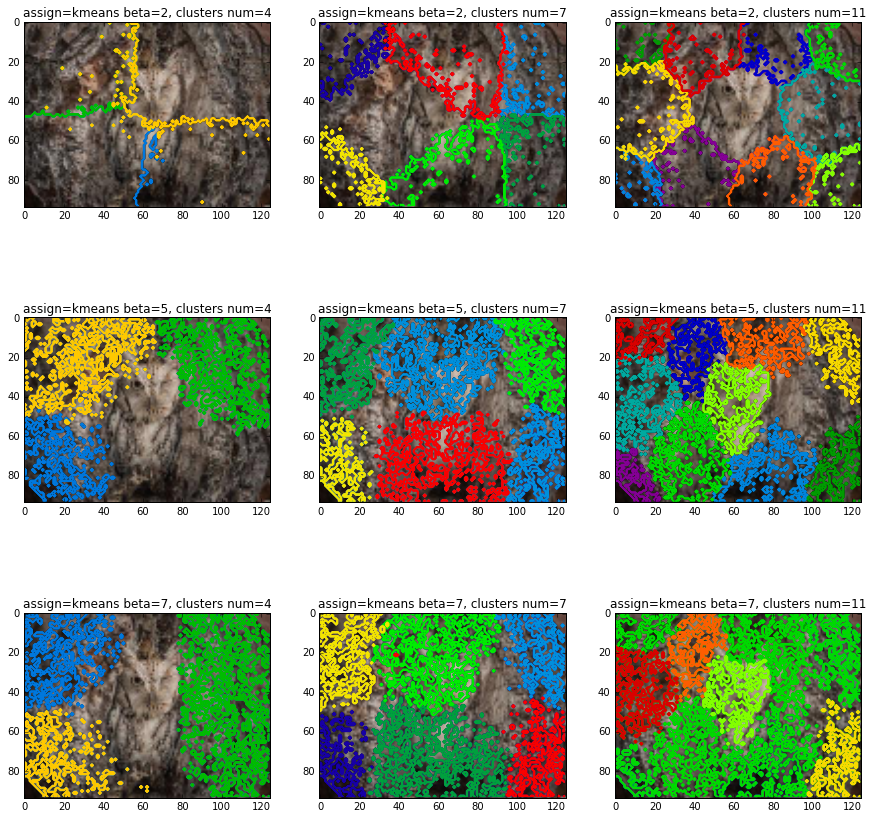

In [98]:
MakeSpectral(owl, assign='kmeans', betas=[2,5,7], N_CLUSTERS=[4,7,11])

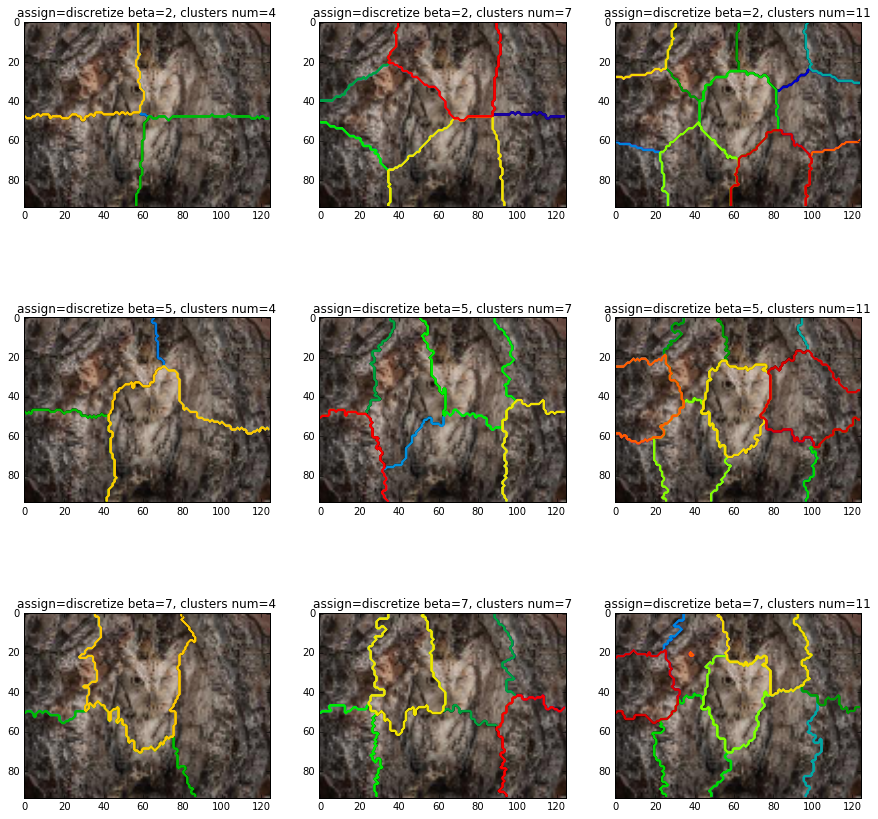

In [99]:
MakeSpectral(owl, assign='discretize', betas=[2,5,7], N_CLUSTERS=[4,7,11])

Измерять качество сегментации в этом пункте не нужно, в результате ожидаются только картинки и выводы.

### Рекомендации к выполнению
Для работы с изображениями удобно использовать библиотеку [Scikit-Image](http://scikit-image.org). 
Установите [PIL](http://www.pythonware.com/products/pil/) для возможности чтения формата JPG.

Пример чтения изображения в матрицу:

    from skimage.io import imread
    I = imread('http://www.birdsgallery.net/gallery/parrots/parrots_4.jpg')

    figure(figsize=(15, 5))
        for i in xrange(3):
        subplot(1, 3, i)
        imshow(I[:,:,i])

## Тематическое моделирование

![](http://imgur.com/S8WgwBp.png)

Тематическое моделирование является популярным инструментом анализа текстов. Задача заключается в поиске тем $T$, которые хорошо бы описывали документы $D$ со словарём $W$. Большинство тематических моделей оперирует данными в формате "мешка слов", т.е. учитывают только частоты слов в документах, а не их порядок. Одной из простейших тематических моделей является [PLSA](https://en.wikipedia.org/wiki/Probabilistic_latent_semantic_analysis), которая приводит к задаче стохастического матричного разложения: 

$$F \approx \Phi \times \Theta$$
где
- $F_{W \times D}$— матрица распределений слов в документах (нормированные частоты)
- $\Phi_{W \times T}$ — матрица распределений слов в темах (модель)
- $\Theta_{T \times D}$ — матрица распределений тем в документах (результат применения модели к обучающим данным)

Можно сказать, что алгоритмы тематического моделирования производят мягкую бикластеризацию данных:
 - *мягкую*, так как объекты относятся не строго к одному кластеру, а к нескольким с разными вероятностями
 - *бикластеризацию*, так как модель одновременно кластеризует слова по темам и темы по документам.

### EM-алгоритм

![](http://imgur.com/EeIuI1T.png)

С вероятностной точки зрения, задача обучения модели PLSA ставится как максимизация неполного правдоподобия по параметам $\Phi$ и $\Theta$. ЕМ-алгоритм для модели PLSA заключается в повторении двух шагов:

- **Е-шаг** — оценка распределений тем для каждого слова в каждом документе по параметрам $\Phi$ и $\Theta$ (шаг 6);
- **М-шаг** — обновление параметров $\Phi$ и $\Theta$ на основе полученных оценок (шаги 7 и 9).

Существуют различные модификации итерационного процесса, позволяющие снизить расходы по памяти. В данном случае, мы избегаем хранения трехмерной матрицы $p_{tdw}$, сразу пересчитывая $\Theta$ для текущего документа и аккумулируя счетчики $n_{wt}$ для последующего пересчета $\Phi$.

Псевдокод алгритма записывается следующим образом:

1. Инициализировать $\phi_{wt}^0$ для всех $w \in W$, $t \in T$ и $\theta_{td}^0$ для всех $t \in T$, $d \in D$
2. Внешний цикл по итерациям $i = 1 ... max\_iter$:
3. $\quad$ $n_{wt}^i := 0$, $n_t^i := 0$ для всех $w \in W$ и $t \in T$ 
4. $\quad$ Внутренний цикл по документам $d \in D$  
5. $\qquad$ $Z_w := \sum_{t \in T} \phi_{wt}^{i-1}\theta_{td}^{i-1}$ для всех $w \in d$ $\cfrac{}{}$
6. $\qquad$ $p_{tdw} := \cfrac{ \phi_{wt}^{i-1}\theta_{td}^{i-1} }{ Z_w }$ (**E-шаг**)
7. $\qquad$ $\theta_{td}^{i} := \cfrac{ \sum_{w \in d} n_{dw} p_{tdw} }{ n_d }$ для всех $t \in T$ (**M-шаг**)
8. $\qquad$ Увеличить $n_{wt}^i$ и $n_t^i$ на $n_{dw} p_{tdw}$ для всех $w \in W$ и $t \in T$
9. $\quad \phi_{wt}^i := \cfrac{n_{wt}^i}{n_t^i}$ для всех $w \in W$ и $t \in T$ (**M-шаг**)

Обозначения:
 - $p_{tdw}$ — вероятность темы $t$ для слова $w$ в документе $d$
 - $\phi_{wt}$ — элемент матрицы $\Phi$, соответствующий вероятности слова $w$ в теме $t$
 - $\theta_{td}$ — элемент матрицы $\Theta$, соответствующий вероятности темы $t$ в документе $d$
 - $n_{wt}$ — элемент матрицы счётчиков отнесения слова $w$ к теме $t$ (путем нормирования этой матрицы получается матрица $\Phi$)
 - $Z_w$ — элемент вектора вспомогательных переменных, соответствующий слову $w$
 - $n_t$ — вектор нормировочных констант для матрицы $n_{wt}$
 - $n_d$ — вектор нормировочных констант для матрицы $n_{dw}$
 - $n$ — суммарное число слов в коллекции



###  Оценка качества

Для оценивания качества построенной модели и контроля сходимости процесса обучения обычно используют [перплексию](http://www.machinelearning.ru/wiki/images/8/88/Voron-iip9-talk.pdf):

$$\mathcal{P} = \exp\bigg(- \frac{\mathcal{L}}{n} \bigg) = \exp\bigg(- \cfrac{1}{n}\sum_{d \in D}\sum_{w \in d} n_{dw} \ln \big(\sum_{t \in T}\phi_{wt}\theta_{td} \big)\bigg)$$

Это традиционная мера качества в тематическом моделировании, которая основана на правдоподобии модели $\mathcal{L}$. Число итераций $max\_iter$ в алгоритме обучения следует выбирать достаточным для того, чтобы перплексия перестала существенно убывать. Однако известно, что перплексия плохо отражает интерпретируемость найденных тем, поэтому помимо нее обычно используются дополнительные меры или экспертные оценки.

Загрузите [коллекцию писем Х. Клинтон](https://www.kaggle.com/kaggle/hillary-clinton-emails/downloads/hillary-clinton-emails-release-2015-09-11-01-39-01.zip) с kaggle. Для скачивания может потребоваться регистрация.

In [2]:
import pandas as pd
emails = pd.read_csv('output/Emails.csv')
emails

,Id,DocNumber,MetadataSubject,MetadataTo,MetadataFrom,SenderPersonId,MetadataDateSent,MetadataDateReleased,MetadataPdfLink,MetadataCaseNumber,...,ExtractedTo,ExtractedFrom,ExtractedCc,ExtractedDateSent,ExtractedCaseNumber,ExtractedDocNumber,ExtractedDateReleased,ExtractedReleaseInPartOrFull,ExtractedBodyText,RawText
0,1,C05739545,WOW,H,"Sullivan, Jacob J",87.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739545...,F-2015-04841,...,NaN,"Sullivan, Jacob J <Sullivan11@state.gov>",NaN,"Wednesday, September 12, 2012 10:16 AM",F-2015-04841,C05739545,05/13/2015,RELEASE IN FULL,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
1,2,C05739546,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,H,NaN,NaN,2011-03-03T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739546...,F-2015-04841,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739546,05/13/2015,RELEASE IN PART,"B6\nThursday, March 3, 2011 9:45 PM\nH: Latest...",UNCLASSIFIED\nU.S. Department of State\nCase N...
2,3,C05739547,CHRIS STEVENS,;H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739547...,F-2015-04841,...,B6,"Mills, Cheryl D <MillsCD@state.gov>","Abedin, Huma","Wednesday, September 12, 2012 11:52 AM",F-2015-04841,C05739547,05/14/2015,RELEASE IN PART,Thx,UNCLASSIFIED\nU.S. Department of State\nCase N...
3,4,C05739550,CAIRO CONDEMNATION - FINAL,H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739550...,F-2015-04841,...,NaN,"Mills, Cheryl D <MillsCD@state.gov>","Mitchell, Andrew B","Wednesday, September 12,2012 12:44 PM",F-2015-04841,C05739550,05/13/2015,RELEASE IN PART,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
4,5,C05739554,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,"Abedin, Huma",H,80.0,2011-03-11T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739554...,F-2015-04841,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739554,05/13/2015,RELEASE IN PART,"H <hrod17@clintonemail.com>\nFriday, March 11,...",B6\nUNCLASSIFIED\nU.S. Department of State\nCa...
5,6,C05739559,MEET THE RIGHT-WING EXTREMIST BEHIND ANTI-MUSL...,Russorv@state.gov,H,80.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739559...,F-2015-04841,...,NaN,NaN,NaN,"Wednesday, September 12, 2012 01:00 PM",F-2015-04841,C05739559,05/13/2015,RELEASE IN PART,Pis print.\n-•-...-^\nH < hrod17@clintonernail...,B6\nUNCLASSIFIED\nU.S. Department of State\nCa...
6,7,C05739560,"ANTI-MUSLIM FILM DIRECTOR IN HIDING, FOLLOWING...",H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739560...,F-2015-04841,...,NaN,"Mills, Cheryl D <MillsCD@state.gov>",NaN,"Wednesday, September 12, 2012 4:00 PM",F-2015-04841,C05739560,05/13/2015,RELEASE IN FULL,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
7,8,C05739561,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,"Abedin, Huma",H,80.0,2011-03-11T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739561...,F-2015-04841,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739561,05/13/2015,RELEASE IN PART,"H <hrod17@clintonemail.corn>\nFriday, March 11...",B6\nUNCLASSIFIED\nU.S. Department of State\nCa...
8,9,C05739562,SECRETARY'S REMARKS,H,"Sullivan, Jacob J",87.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739562...,F-2015-04841,...,NaN,"Sullivan, Jacob J <Sullivanli@stategov>",NaN,"Wednesday, September 12, 2012 6:08 PM",F-2015-04841,C05739562,05/13/2015,RELEASE IN FULL,FYI,UNCLASSIFIED\nU.S. Department of State\nCase N...
9,10,C05739563,MORE ON LIBYA,H,NaN,NaN,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739563...,F-2015-04841,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739563,05/13/2015,RELEASE IN PART,"B6\nWednesday, September 12, 2012 6:16 

Извлеките полные тексты писем из файла *Emails.csv* и подготовьте данные в формате "мешка слов" с помощью функции  [CountVectorizer](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html) пакета sklearn. Рекомендуется произвести фильтрацию слов по частотности для удаления слишком редких и стоп-слов (рекомендованный нижний порог в пределах 10 и верхний 400-600).

In [3]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(analyzer='word', min_df=10, max_df=500)
words=vectorizer.fit_transform(emails['ExtractedBodyText'].dropna().values)
words

<6742x4299 sparse matrix of type '<type 'numpy.int64'>'
	with 190610 stored elements in Compressed Sparse Row format>

In [66]:
len(vectorizer.stop_words_)

24487

In [147]:
wordsd = words.todense()
is_message_empty = np.array(wordsd.sum(axis=1) == 0).reshape(-1)
words_clear = wordsd[np.logical_not(is_message_empty)]
#words_freq = words_clear / (1.0 * words_clear.sum(axis = 1))
F = words_clear.T


Реализуйте описанный выше ЕМ-алгоритм для модели $PLSA$ и добавьте в вашу реализацию подсчёт перплексии.

**(3 балла)** Примените ваш алгоритм к подготовленным данным, рассмотрите число тем T = 5. Постройте график значения перплексии в зависимости от итерации (убедитесь в корректности реализации: график перплексии должен быть невозрастающим). Выведите для каждой темы топ-20 наиболее вероятных слов. 

In [221]:
def em_plsa (F, n_topics=5, max_iter=50):        #F size  words * docs   -- not freqs, but absolute values
    
    ntotal = float(np.sum(F))
    perplexion = []
    
    nd = (np.array(F.sum(axis = 0)).reshape(-1)).astype(float)                         #size  1 * docs
    Phi = np.matrix(np.random.rand(F.shape[0], n_topics))    #size  words * topics
    Phi /= Phi.sum(axis=0) 
    
    Theta = np.matrix(np.random.rand(n_topics, F.shape[1]))   #size  topics * docs
    Theta /= Theta.sum(axis=0) 
    
    for it in xrange(max_iter):
        nwt = np.matrix(np.zeros((F.shape[0], n_topics)))   # words * topics
        nt = np.matrix(np.zeros(n_topics))                  # 1 * topics 
        for d in xrange(F.shape[1]):
            words_in_doc =  np.array(F[:,d] > 0).reshape(-1)  #true false whether word in doc
            Z = Phi[words_in_doc].dot(Theta[:,d])                    #size  words_in_doc * 1
            p = np.multiply(Phi[words_in_doc], Theta[:,d].T)  #matrix size words_in_doc*n_topics
            p = np.divide(p, Z)
            
            Theta[:, d] = p.T.dot(F[words_in_doc, d]) 
            nt += (Theta[:, d]).T
            Theta[:, d] /= nd[d]
            
            nwt[words_in_doc] +=  np.multiply(p, F[words_in_doc, d])
            
        Phi = np.divide(nwt, nt)
        
        perplexion.append(np.exp(- np.sum(np.multiply(F, np.log(Phi.dot(Theta)))) / ntotal))
        # print 'iteration number ' + str(it)
    
    return Phi, Theta, perplexion

In [222]:
phi, theta, perplexion = em_plsa(F, 5)

In [223]:
list_of_words = np.array(vectorizer.get_feature_names())

for topic in range(5):
    most_important_words = np.argsort(np.array(phi[:,topic]).reshape(-1))[-20:]
    print list_of_words[most_important_words]
    print " "

[u'mills' u'com' u'depart' u'route' u'en' u'arrive' u'45' u'tomorrow'
 u'cheryl' u'department' u'11' u'12' u'room' u'15' u'meeting' u'00' u'10'
 u'30' u'office' u'secretary']
 
[u'them' u'should' u'clinton' u'how' u'our' u'people' u'which' u'no' u'us'
 u'who' u'his' u'when' u'been' u'one' u'more' u'its' u'israel' u'their'
 u'her' u'she']
 
[u'more' u'secretary' u'mcchrystal' u'other' u'been' u'last' u'military'
 u'afghan' u'work' u'security' u'which' u'support' u'government' u'their'
 u'new' u'us' u'afghanistan' u'said' u'women' u'our']
 
[u'waiver' u'select' u'comm' u'produced' u'dept' u'agreement' u'sensitive'
 u'department' u'05' u'house' u'date' u'doc' u'information' u'subject'
 u'case' u'benghazi' u'ok' u'13' u'2015' u'no']
 
[u'after' u'white' u'right' u'been' u'when' u'new' u'their' u'mr' u'were'
 u'one' u'him' u'more' u'party' u'house' u'president' u'said' u'had' u'who'
 u'obama' u'his']
 


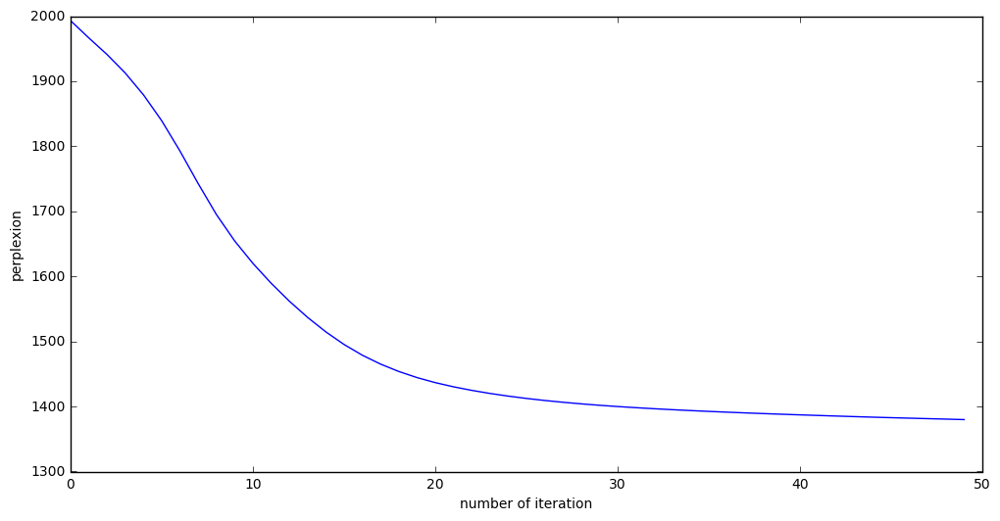

In [224]:
plt.figure(figsize=(12,6))
plt.plot(range(len(perplexion)), perplexion)
plt.xlabel('number of iteration')
plt.ylabel('perplexion')

**(0.5 балл)** Рассмотрите число тем T = 10, 20. Сравните между собой топ-20 наиболее вероятных слов в каждой теме (а также для модели, полученной ранее). Можно ли сказать, что конкретность каждой темы изменяется с ростом их числа?

In [225]:
phi10, theta10, perplexion10 = em_plsa(F, 10)
phi20, theta20, perplexion20 = em_plsa(F, 20)


In [226]:
for topic in range(10):
    most_important_words = np.argsort(np.array(phi10[:,topic]).reshape(-1))[-20:]
    print list_of_words[most_important_words]
    print " "
    

[u'wednesday' u'millscd' u'saturday' u'12' u'friday' u'monday' u'10'
 u'sunday' u'sullivan' u'may' u'hrod17' u'abedin' u'thx' u'clintonemail'
 u'mills' u'fw' u'huma' u'com' u'cheryl' u'b6']
 
[u'll' u'dc' u'good' u'today' u'please' u'tomorrow' u'below' u'cdm' u'lona'
 u'work' u'my' u'647' u'202' u'secretary' u'need' u'back' u'email' u'let'
 u'her' u'ok']
 
[u'policy' u'been' u'last' u'him' u'administration' u'house' u'clinton'
 u'new' u'general' u'afghanistan' u'white' u'one' u'mcchrystal' u'had'
 u'who' u'said' u'mr' u'president' u'obama' u'his']
 
[u'vote' u'her' u'him' u'democratic' u'new' u'democrats' u'republicans'
 u'right' u'care' u'health' u'party' u'were' u'had' u'house' u'president'
 u'percent' u'republican' u'who' u'obama' u'his']
 
[u'select' u'waiver' u'comm' u'05' u'13' u'dept' u'produced' u'sensitive'
 u'house' u'agreement' u'subject' u'doc' u'date' u'case' u'benghazi'
 u'information' u'our' u'department' u'2015' u'no']
 
[u'after' u'them' u'his' u'last' u'when' u'politi

In [227]:
for topic in range(20):
    most_important_words = np.argsort(np.array(phi20[:,topic]).reshape(-1))[-20:]
    print list_of_words[most_important_words]
    print " "

[u'via' u'contact' u'need' u'letter' u'forward' u'discuss' u'send' u'draft'
 u'memo' u'thank' u'hillary' u'our' u'blackberry' u'sid' u'please' u'yes'
 u'email' u'thx' u'my' u'sent']
 
[u'hope' u'work' u'here' u'should' u'll' u'going' u'need' u'best' u'my'
 u'go' u'tomorrow' u'very' u'think' u'like' u'want' u'when' u'let' u'back'
 u'talk' u'him']
 
[u'reports' u'below' u'issues' u'new' u'public' u'other' u'officials'
 u'foreign' u'affairs' u'secretary' u'development' u'international'
 u'national' u'b5' u'report' u'diplomacy' u'part' u'release' u'department'
 u'b6']
 
[u'branch' u'foreign' u'did' u'petraeus' u'former' u'administration'
 u'policy' u'who' u'washington' u'new' u'him' u'clinton' u'white' u'had'
 u'house' u'said' u'president' u'mr' u'obama' u'his']
 
[u'news' u'min' u'committee' u'north' u'she' u'president' u'death'
 u'reform' u'republican' u'bill' u'her' u'were' u'white' u'who' u'palin'
 u'his' u'house' u'obama' u'care' u'health']
 
[u'security' u'process' u'settlements' u'a

Да, можно сказать, что темы становятся более конкретными. Так международная политика подразбивается на отдельные регионы, видны отдельные военные конфликты, видна тема выборов, партий в конгрессе и тд.

**(0.5 балл)** Протестируйте модель для разных начальных приближений. Что можно сказать об устойчивости алгоритма (идентичны ли топовые слова в соответствующих темах моделей)?

In [228]:
phi1, theta1, perplexion1 = em_plsa(F, 5)
for topic in range(5):
    most_important_words = np.argsort(np.array(phi1[:,topic]).reshape(-1))[-20:]
    print list_of_words[most_important_words]
    print " "

[u'house' u'residence' u'conference' u'private' u'11' u'depart' u'route'
 u'en' u'arrive' u'12' u'45' u'department' u'room' u'10' u'15' u'meeting'
 u'00' u'30' u'office' u'secretary']
 
[u'sensitive' u'department' u'produced' u'doc' u'13' u'who' u'their'
 u'peace' u'date' u'house' u'subject' u'his' u'information' u'israeli'
 u'benghazi' u'agreement' u'case' u'2015' u'israel' u'no']
 
[u'clintonemail' u'10' u'monday' u'talk' u'sent' u'good' u'back' u'want'
 u'mills' u'fw' u'let' u'may' u'him' u'huma' u'today' u'com' u'cheryl'
 u'tomorrow' u'my' u'b6']
 
[u'house' u'party' u'than' u'him' u'mr' u'new' u'been' u'when' u'were'
 u'their' u'one' u'more' u'her' u'president' u'she' u'said' u'had' u'who'
 u'obama' u'his']
 
[u'how' u'military' u'world' u'government' u'other' u'one' u'new' u'united'
 u'states' u'more' u'which' u'afghanistan' u'work' u'security' u'people'
 u'its' u'women' u'us' u'their' u'our']
 


In [229]:
phi2, theta2, perplexion2 = em_plsa(F, 5)
for topic in range(5):
    most_important_words = np.argsort(np.array(phi2[:,topic]).reshape(-1))[-20:]
    print list_of_words[most_important_words]
    print " "

[u'did' u'll' u'need' u'like' u'talk' u'ok' u'work' u'today' u'good' u'let'
 u'back' u'want' u'when' u'she' u'should' u'think' u'tomorrow' u'her'
 u'him' u'my']
 
[u'american' u'house' u'party' u'she' u'its' u'which' u'when' u'than'
 u'been' u'new' u'one' u'were' u'more' u'said' u'president' u'their' u'had'
 u'who' u'obama' u'his']
 
[u'sid' u'saturday' u'wednesday' u'thursday' u'sullivan' u'his' u'sunday'
 u'hrod17' u'friday' u'mcchrystal' u'afghanistan' u'abedin' u'huma'
 u'clintonemail' u'may' u'mills' u'fw' u'cheryl' u'said' u'com']
 
[u'these' u'which' u'agreement' u'benghazi' u'government' u'information'
 u'world' u'case' u'us' u'its' u'united' u'states' u'2015' u'people'
 u'department' u'security' u'women' u'their' u'our' u'no']
 
[u'house' u'conference' u'25' u'private' u'depart' u'route' u'en' u'arrive'
 u'11' u'12' u'45' u'department' u'room' u'15' u'meeting' u'00' u'10' u'30'
 u'office' u'secretary']
 


In [230]:
phi3, theta3, perplexion3 = em_plsa(F, 5)
for topic in range(5):
    most_important_words = np.argsort(np.array(phi3[:,topic]).reshape(-1))[-20:]
    print list_of_words[most_important_words]
    print " "

[u'who' u'american' u'should' u'president' u'peace' u'new' u'israeli'
 u'said' u'been' u'military' u'security' u'more' u'one' u'which'
 u'afghanistan' u'its' u'us' u'their' u'his' u'israel']
 
[u'private' u'mills' u'b6' u'depart' u'route' u'en' u'arrive' u'cheryl'
 u'45' u'department' u'11' u'room' u'12' u'meeting' u'15' u'00' u'10' u'30'
 u'office' u'secretary']
 
[u'she' u'll' u'yes' u'work' u'when' u'sent' u'may' u'should' u'talk'
 u'her' u'think' u'let' u'want' u'back' u'ok' u'good' u'him' u'today'
 u'tomorrow' u'my']
 
[u'sensitive' u'us' u'house' u'subject' u'women' u'states' u'date' u'world'
 u'united' u'benghazi' u'people' u'agreement' u'information' u'their'
 u'china' u'case' u'department' u'2015' u'our' u'no']
 
[u'which' u'than' u'house' u'when' u'clinton' u'new' u'been' u'party'
 u'more' u'one' u'were' u'president' u'their' u'her' u'she' u'said' u'had'
 u'obama' u'who' u'his']
 


 Многие слова идентичны, хотя совпадение не стопроцентное. Очевидно, что при различных начальных матрицах Тета и Фи (которые генерируются случайно), получаются, различные наборы слов. Тем не менее, темы выглядят похожими, что говорит о достаточно хорошей устойчивости алгоритма.

### Рекомендации к выполнению
- ЕМ-алгоритм стоит реализовывать с использованием векторных операций. Для проверки корректности реализации сперва можно написать скалярную версию, после чего векторизовать её, удостоверившись, что обе реализации дают одинаковый результат. Невекторизованный алгоритм может работать в сотни раз медленнее векторизованного, и его использование может привести к невозможности выполнения задания.
- Итерационный процесс следует начинать, инициализировав матрицы $\Phi$ и $\Theta$. Инициализация может быть случайной, важно не забыть отнормировать столбцы матриц.
- Неэффективная реализация перплексии может в разы замедлить работу алгоритма.

### Модель LDA и визуализация

Модель [LDA](https://en.wikipedia.org/wiki/Latent_Dirichlet_allocation) является наиболее популярной тематической моделью. Единственное отличие от модели PLSA заключается в введении априорных распределений Дирихле на столбцы матриц $\Phi$ и $\Theta$, которое может способствовать дополнительному сглаживанию или разреживанию параметров.

В этом задании предлагается воспользоваться реализацией модели [LdaModel](https://radimrehurek.com/gensim/models/ldamodel.html), обучение которой основано на вариационном байесовском выводе.

Для выполнения задания вам потребуется установить пакеты [gensim](https://radimrehurek.com/gensim/install.html) и [pyldavis 2.0](https://pyldavis.readthedocs.io/en/latest/readme.html#installation).

In [187]:
from gensim import matutils
from gensim.models.ldamodel import LdaModel

In [211]:

def print_topics(lda, vocab, num_topics=5, n=20):
    """ Print the top words for each topic. """
    topics = lda.show_topics(num_topics=num_topics, num_words=20, log=False, formatted=True)
    for  topic in topics:
        print topic
        print " "

Подготовьте данные в формате, подходящем для *gensim* (полное API gensim можно найти [здесь](https://radimrehurek.com/gensim/apiref.html)). Пример обработки вывода *CountVectorizer* для gensim можно найти [здесь](https://gist.github.com/aronwc/8248457).

In [195]:
data_for_LDA = matutils.Dense2Corpus(words_clear.T)
vocab_for_LDA = dict([(i, s) for i, s in enumerate(list_of_words)])

**(1 балл)** Примените [LdaModel](https://radimrehurek.com/gensim/models/ldamodel.html) к подготовленным данным (рекомендуется задать заведомо большое число итераций в параметре *passes*, например, 30). Визуально сравните полученные темы по топ-20 наиболее вероятным словам с темами, полученными вашей реализацией ЕМ-алгоритма. У какой из моделей получились более интерпретируемые темы?

In [246]:
#lda = LdaModel(data_for_LDA, num_topics=5, passes=30, id2word=vocab_for_LDA)
print_topics(lda, vocab_for_LDA)

(0, u'0.013*his + 0.008*obama + 0.008*had + 0.007*who + 0.006*their + 0.006*said + 0.006*been + 0.005*one + 0.005*were + 0.005*more + 0.005*people + 0.005*she + 0.005*no + 0.005*him + 0.004*president + 0.004*which + 0.004*house + 0.004*her + 0.004*clinton + 0.004*when')
 
(1, u'0.009*today + 0.008*tomorrow + 0.008*back + 0.007*pls + 0.007*want + 0.007*good + 0.007*him + 0.007*think + 0.007*work + 0.006*when + 0.006*her + 0.006*our + 0.006*my + 0.006*talk + 0.006*should + 0.006*let + 0.006*ll + 0.006*cdm + 0.005*email + 0.005*need')
 
(2, u'0.044*secretary + 0.042*office + 0.037*00 + 0.035*30 + 0.026*meeting + 0.025*10 + 0.025*room + 0.022*department + 0.022*15 + 0.016*no + 0.015*45 + 0.014*11 + 0.014*conference + 0.014*arrive + 0.013*en + 0.013*private + 0.013*route + 0.013*depart + 0.012*2015 + 0.012*house')
 
(3, u'0.010*his + 0.010*new + 0.009*our + 0.007*nuclear + 0.007*american + 0.007*who + 0.007*treaty + 0.006*their + 0.006*mr + 0.006*its + 0.006*states + 0.006*should + 0.005*un

In [216]:
lda10 = LdaModel(data_for_LDA, num_topics=10, passes=30, id2word=vocab_for_LDA)
print_topics(lda10, vocab_for_LDA, num_topics=10)

(0, u'0.014*him + 0.013*today + 0.013*think + 0.011*good + 0.011*could + 0.010*work + 0.010*tomorrow + 0.010*talk + 0.009*want + 0.008*back + 0.008*like + 0.007*one + 0.007*wanted + 0.007*ll + 0.006*morning + 0.006*need + 0.006*make + 0.006*week + 0.006*email + 0.006*when')
 
(1, u'0.053*b6 + 0.037*ok + 0.028*pls + 0.023*yes + 0.020*b1 + 0.020*pis + 0.019*print + 0.017*release + 0.017*part + 0.015*thx + 0.015*melanne + 0.015*add + 0.014*list + 0.012*ops + 0.010*mtg + 0.010*email + 0.009*please + 0.009*b5 + 0.009*12 + 0.008*sure')
 
(2, u'0.030*bloomberg + 0.022*fw + 0.021*december + 0.019*com + 0.018*cheryl + 0.017*mills + 0.015*10 + 0.014*clintonemail + 0.014*11 + 0.014*12 + 0.014*huma + 0.013*monday + 0.012*sullivan + 0.012*abedin + 0.012*millscd + 0.012*hrod17 + 0.011*saturday + 0.011*wednesday + 0.011*percent + 0.010*13')
 
(3, u'0.018*mr + 0.016*said + 0.016*israel + 0.013*his + 0.008*company + 0.008*new + 0.008*government + 0.008*media + 0.007*israeli + 0.007*david + 0.007*mayor 

In [245]:

lda20 = LdaModel(data_for_LDA, num_topics=20, passes=30, id2word=vocab_for_LDA)
print_topics(lda20, vocab_for_LDA, num_topics=20)

(0, u'0.064*sent + 0.043*yes + 0.039*draft + 0.028*blackberry + 0.026*email + 0.025*statement + 0.023*via + 0.023*send + 0.022*my + 0.020*original + 0.018*mail + 0.017*message + 0.015*ll + 0.015*letter + 0.015*dan + 0.015*thanks + 0.015*speech + 0.012*21 + 0.011*address + 0.011*02')
 
(1, u'0.087*below + 0.045*think + 0.042*cdm + 0.037*bottom + 0.031*traffic + 0.026*richard + 0.026*folks + 0.022*several + 0.020*january + 0.017*may + 0.017*email + 0.017*mike + 0.015*michael + 0.015*message + 0.015*name + 0.014*feel + 0.014*made + 0.013*line + 0.012*fuchs + 0.012*page')
 
(2, u'0.053*mr + 0.040*bloomberg + 0.034*said + 0.023*company + 0.023*his + 0.019*mayor + 0.016*new + 0.015*party + 0.013*sid + 0.012*david + 0.011*news + 0.011*city + 0.011*media + 0.010*york + 0.010*brown + 0.009*last + 0.009*agreement + 0.009*run + 0.009*labour + 0.009*times')
 
(3, u'0.010*their + 0.007*its + 0.007*more + 0.006*government + 0.006*us + 0.005*other + 0.005*these + 0.004*who + 0.004*which + 0.004*been 

Темы получились похожими на те, что были получены EM-алгоритмом. Не могу сказать, что где-то они лучше или хуже интерпретируются.

**(1 балл)** Визуализируйте модель из gensim с помощью ldavis (описание API LDAvis для работы с gensim есть [здесь](http://pyldavis.readthedocs.io/en/latest/modules/API.html)), пример — [здесь](https://github.com/bmabey/pyLDAvis/blob/master/notebooks/pyLDAvis_overview.ipynb).

In [235]:
from gensim.corpora import Dictionary
dictionary = Dictionary.from_corpus(data_for_LDA, vocab_for_LDA)

In [240]:
import pyLDAvis.gensim

pyl5 =  pyLDAvis.gensim.prepare(lda, data_for_LDA, dictionary)
pyl10 =  pyLDAvis.gensim.prepare(lda10, data_for_LDA, dictionary)
pyl20 =  pyLDAvis.gensim.prepare(lda20, data_for_LDA, dictionary)

In [241]:
pyLDAvis.display(pyl5)

In [242]:
pyLDAvis.display(pyl10)

In [243]:
pyLDAvis.display(pyl20)

In [249]:
pyLDAvis.save_html(pyl5, "pyl5.html")
pyLDAvis.save_html(pyl10, "pyl10.html")
pyLDAvis.save_html(pyl20, "pyl20.html")

### Рекомендации к выполнению
Для обучения *LdaModel* и её последующей визуализации потребуется словарь формата gensim, который можно получить следующей командой

    dictionary = gensim.corpora.Dictionary.from_corpus(corpora, vocab_dict)

где *corpora* содержит полученное с помощью gensim представление коллекции, а *vocab_dict* — это dict, полученный после работы CountVectorizer, ставящий в соответствие каждому номеру строки в матрице данных само слово в виде строки.